# HOMEWORK 9

In this homework, you are going to use the dlib face detector and apply it to an image of your liking. You can follow the procedure shown in lesson 9. Please always comment your code so I can see what you're doing :-)

For this homework we are not going to provide you with any code, you'll have to build the face detector on your own.

### Step 0

Run the necessary imports.

In [1]:
import cv2
import numpy as np
import dlib
from matplotlib import pyplot as plt


plt.rcParams['figure.figsize'] = [15, 33]

### Step 1

Load an image (any image that contains faces).

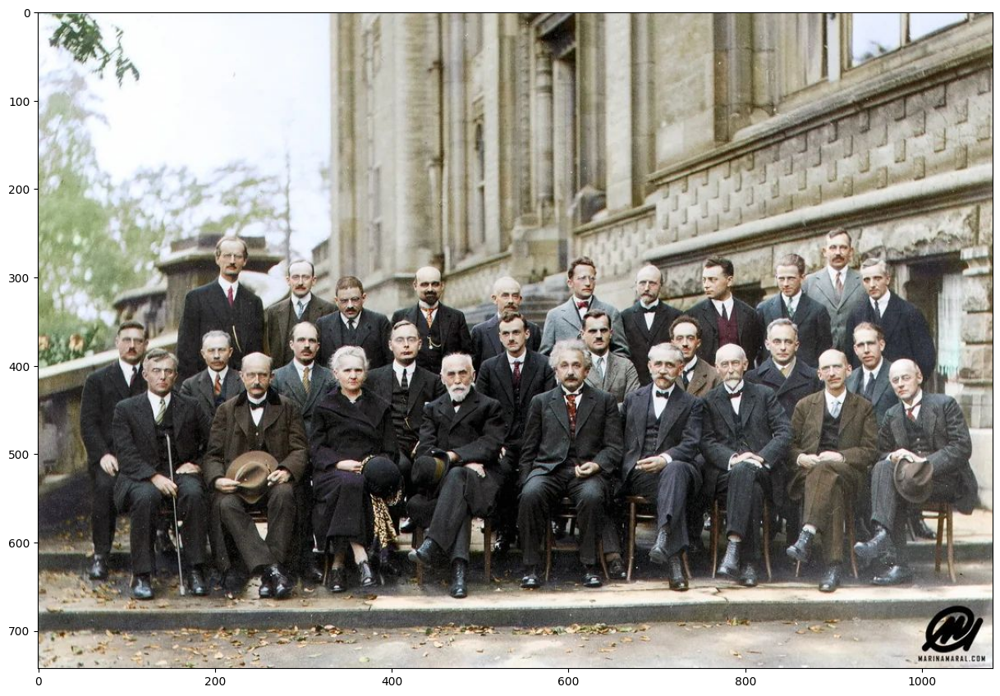

In [2]:
img = cv2.imread('scientists.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
plt.imshow(img)

### Step 2

Load the dlib face predictor.

In [3]:
detector = dlib.get_frontal_face_detector()

### Step 3

Run the predictor on your image.

In [4]:
rects_1 = detector(gray, 1)
rects_2 = detector(gray, 2)
rects_3 = detector(gray, 3)

### Step 4

Draw bounding boxes around the detected faces and plot the image. Use different colour for each face.

(<Axes: title={'center': 'dlib scale=3'}>,
 Text(0.5, 1.0, 'dlib scale=3'))

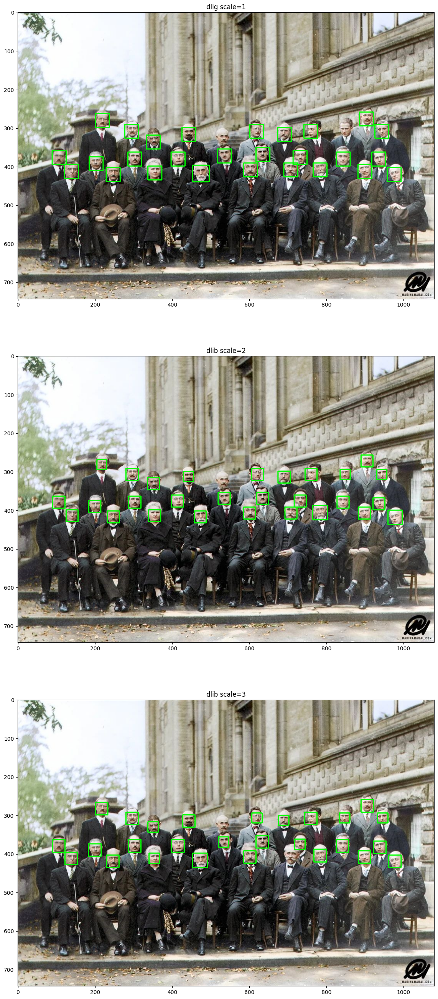

In [5]:
# print('Number of detected faces:', len(rects))
# print(rects)
# print(rects[0].left)

def rect_to_bb(rect):
    # Dlib rect --> OpenCV rect
    x = rect.left()
    y = rect.top()
    w = rect.right() - x
    h = rect.bottom() - y

    return (x, y, w, h)

def draw_rectangles(img, rects):
    # Draw rectangle around each face
    result = np.copy(img)
    for rect in rects:
        x, y, w, h = rect_to_bb(rect)
        cv2.rectangle(result, (x, y), (x+w, y+h), (0, 255, 0), 2)
    return result
    

plt.subplot(311), plt.imshow(draw_rectangles(img, rects_1)), plt.title('dlig scale=1')
plt.subplot(312), plt.imshow(draw_rectangles(img, rects_2)), plt.title('dlib scale=2')
plt.subplot(313), plt.imshow(draw_rectangles(img, rects_3)), plt.title('dlib scale=3')

На первом изображении видно что два лица не удалось детектировать, поэтому пришлось увеличивать параметр масштаба для детектора. К сожалению одного из ученых так и не удалось детектировать, возможно из-за того что лицо немного повернуто, а также частично перекрыто лицом ниже.

In [6]:
cnn_detector = dlib.cnn_face_detection_model_v1('mmod_human_face_detector.dat')
detections = cnn_detector(gray, 2)

def draw_rectangles_cnn(img, detections):
    result = np.copy(img)
    for det in detections:
        rect = det.rect
        conf = det.confidence
        if conf > 0.6:  
            cv2.rectangle(result, (rect.left(), rect.top()), (rect.right(), rect.bottom()), (0, 255, 0), 2)
    return result

(<matplotlib.image.AxesImage at 0x11f4f47d0>,
 Text(0.5, 1.0, 'dlib cnn scale=2'))

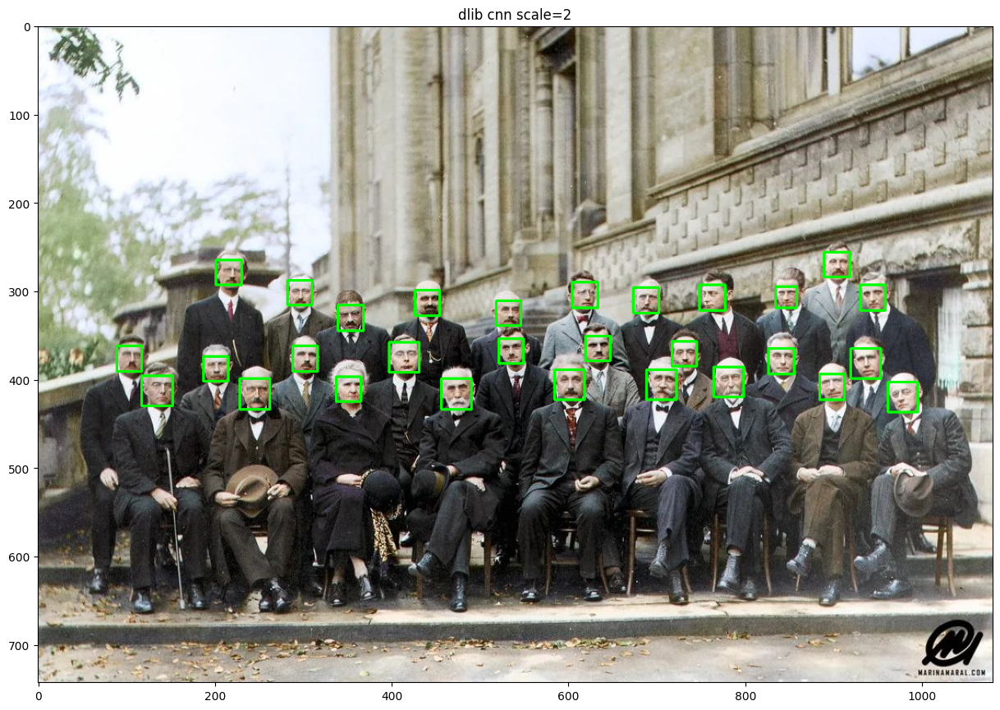

In [7]:
plt.imshow(draw_rectangles_cnn(img, detections)), plt.title('dlib cnn scale=2')

А вот сверточная сеть при двойном масштабирование показывает идеальный результат. Все лица детектированы.

### Step 5 (optional)

Repeat the process with a different and more challenging image (more faces, smaller faces, people with glasses, hats, helmets, etc.). How does the detector perform? Is it robust?

(<Axes: >, <matplotlib.image.AxesImage at 0x11ff8ff50>)

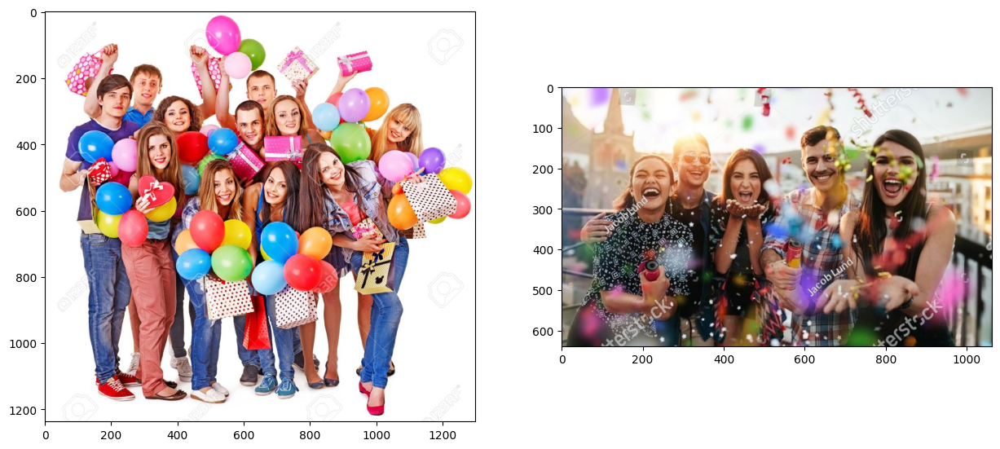

In [8]:
img_faces_balloons = cv2.imread('faces-balloons.jpg')
img_faces_balloons_rgb = cv2.cvtColor(img_faces_balloons, cv2.COLOR_BGR2RGB)
img_faces_balloons_gray = cv2.cvtColor(img_faces_balloons, cv2.COLOR_RGB2GRAY)

img_faces_confetti = cv2.imread('faces-confetti.jpg')
img_faces_confetti_rgb = cv2.cvtColor(img_faces_confetti, cv2.COLOR_BGR2RGB)
img_faces_confetti_gray = cv2.cvtColor(img_faces_confetti, cv2.COLOR_RGB2GRAY)

plt.subplot(121), plt.imshow(img_faces_balloons_rgb)
plt.subplot(122), plt.imshow(img_faces_confetti_rgb)


(<Axes: title={'center': 'dlib cnn scale=1'}>,
 Text(0.5, 1.0, 'dlib cnn scale=1'))

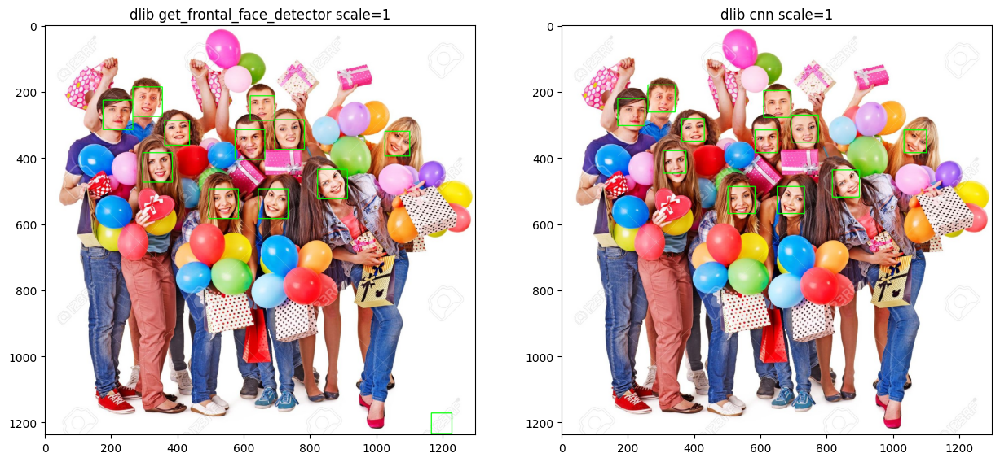

In [9]:
rectanges = detector(img_faces_balloons_gray, 1)
plt.subplot(121), plt.imshow(draw_rectangles(img_faces_balloons_rgb, rectanges)), plt.title('dlib get_frontal_face_detector scale=1')


detections = cnn_detector(img_faces_balloons_gray, 1)
plt.subplot(122), plt.imshow(draw_rectangles_cnn(img_faces_balloons_rgb, detections)), plt.title('dlib cnn scale=1')

(<Axes: title={'center': 'dlib cnn scale=1'}>,
 Text(0.5, 1.0, 'dlib cnn scale=1'))

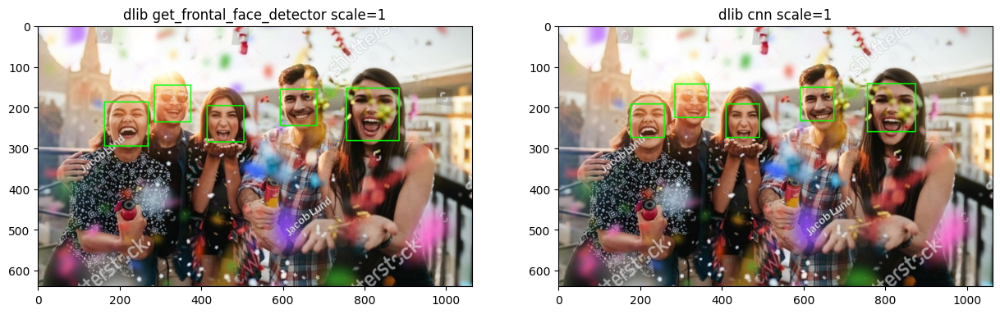

In [10]:
rectanges = detector(img_faces_confetti_gray, 1)
plt.subplot(121), plt.imshow(draw_rectangles(img_faces_confetti_rgb, rectanges)), plt.title('dlib get_frontal_face_detector scale=1')


detections = cnn_detector(img_faces_confetti_gray, 1)
plt.subplot(122), plt.imshow(draw_rectangles_cnn(img_faces_confetti_rgb, detections)), plt.title('dlib cnn scale=1')

Не смотря на конфети оба алгоритма справились хорошо.